# Computer Vision Project : Image Blending 

## Members
- Tarun Raj Singh (B21CS076) 
- Shalin Jain (B21CS070)
- Shashwat Roy (B21CS071)
- Diya Fursule (B21CS026)

## Importing Libraries

In [1]:
import warnings
warnings.filterwarnings('ignore')
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time
import scipy as sp
import scipy.sparse.linalg
from typing import List, Tuple
import tkinter as tk
from tkinter import filedialog

## Utility Functions

In [2]:
# Function to select a file (image) as input
def choose_image():
    root = tk.Tk()
    # root.withdraw() 
    path = filedialog.askopenfilename() 
    root.destroy()  
    return path

In [3]:
# Function to show and plot images using matplotlib
def display_image(input_image, bw=False):
  fig = plt.figure(figsize=(6,6))
  axis = fig.gca()
  axis.get_yaxis().set_visible(False)
  axis.get_xaxis().set_visible(False)
  if (bw):
    axis.imshow(input_image,cmap = 'Greys')
  else:
    axis.imshow(input_image,cmap = None)
  plt.show()

In [4]:
## FUNCTION FOR COMPARATIVE PLOTS FOR BOTH IMAGES

def display_two_images(first_image, second_image, annotation1=None, annotation2=None):
    fig = plt.figure(figsize=(8,6))

    # Display the first image
    plt.subplot(1, 2, 1)
    plt.imshow(first_image)
    plt.axis('off')
    if annotation1:
        plt.annotate(annotation1, xy=(0.5, -0.1), xycoords="axes fraction", ha="center", fontsize=12)

    # Display the second image
    plt.subplot(1, 2, 2)
    plt.imshow(second_image)
    plt.axis('off')
    if annotation2:
        plt.annotate(annotation2, xy=(0.5, -0.1), xycoords="axes fraction", ha="center", fontsize=12)

    # Adjust layout and display
    plt.tight_layout()
    plt.show()

In [117]:
# Function for reading image and masks in proper format from the path
def get_image(img_path: str, mask: bool=False, scale: bool=True) -> np.array:
    if mask:
        img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (1440, 1080))
        _, binary_mask = cv2.threshold(img, 127, 255, cv2.THRESH_BINARY)
        return np.where(binary_mask == 255, 1, 0)
    
    if scale:
        return cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB).astype('double') / 255.0
    
    return cv2.resize(cv2.cvtColor(cv2.imread(img_path), cv2.COLOR_BGR2RGB),(1440,1080))

In [83]:
def show_images(title,imgs: List[np.array], titles: List[str], rows: int, cols: int, figsize: Tuple[int]=(15, 10)) -> None:
    assert len(imgs) == rows * cols, "Number of images should match the number of rows times columns"
    
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    for i, ax in enumerate(axes.flat):
        ax.imshow(imgs[i])
        ax.set_xticks([])
        ax.set_yticks([])
        ax.set_xlabel(titles[i], fontsize=12)
    plt.suptitle(title,fontsize=20)
    plt.tight_layout()
    plt.show()


In [7]:
# Function to draw mask out of the image

def draw_mask(image):
    image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
    cv2.namedWindow("Cut out Mask", cv2.WINDOW_NORMAL)
    drawing = False
    ix,iy = -1,-1
    cut_points = []

    # Capture mouse
    def mouse_trace(event,x,y,flags,param):
        nonlocal drawing,ix,iy,cut_points
        if event == cv2.EVENT_LBUTTONDOWN:
            drawing = True
            ix,iy = x,y
            cut_points = [(ix,iy)]

        elif event == cv2.EVENT_MOUSEMOVE:
            if drawing == True:
                cv2.line(image,cut_points[-1],(x,y),(0,0,255),2)
                cut_points.append((x,y))
                
        elif event == cv2.EVENT_LBUTTONUP:
            drawing = False
            cv2.line(image, cut_points[-1], (x,y), (0,0,255), 2)
            cut_points.append((x,y))
            points = np.array(cut_points, np.int32)
            points = points.reshape((-1,1,2))
            cv2.fillPoly(mask,[points],(255,255,255))

    # Initial mask is complete black image 
    mask = np.zeros(image.shape[:2], dtype=np.uint8)

    # Register the mouse function
    cv2.setMouseCallback('Cut out Mask', mouse_trace)

    while True:
        cv2.imshow('Cut out Mask',image)
        key = cv2.waitKey(1)

        # Clear the mask on 'c' enter
        if key == ord('c'):
            mask = np.zeros(image.shape[:2],dtype=np.uint8)
            image = image.copy()
        # save the mask on 's' enter
        elif key == ord('s'):
            cv2.destroyWindow('Cut out Mask')
            return cv2.merge([mask,mask,mask])

        # Exit on 'q' press
        elif key == ord('q') or key == 27 or cv2.getWindowProperty('Cut out Mask',cv2.WND_PROP_VISIBLE) < 1:
            cv2.destroyWindow('Cut out Mask')
            return None

In [123]:
def load_images():

    destination = choose_image()
    destination_img = cv2.imread(destination)

    source = choose_image()
    source_img = cv2.imread(source)
    source_img = cv2.resize(source_img, (1440, 1080))
    source_img = cv2.cvtColor(source_img, cv2.COLOR_BGR2RGB)
    
    destination_img = cv2.cvtColor(destination_img, cv2.COLOR_BGR2RGB)
    destination_img = cv2.resize(destination_img, (1440, 1080))
    
    mask = draw_mask(source_img)
    plt.imsave('mask.png', mask)
    return destination_img, source_img, mask,destination, source, 'mask.png'

## Methods for Image Blending

### 1. Cut Paste Blending

In [8]:
# define function to blend based on a mask value

class Cut_Paste_Blend:

    def __init__(self,source_image, destination_image, mask, kernel = (1,1)):

        self.source_image = source_image
        self.destination_image = destination_image
        self.mask = mask
        self.kernel = kernel

    def blend(self):

        mask_blur = cv2.blur(self.mask,self.kernel)
        norm_mask = mask_blur/255
        first_img_t = self.source_image.astype(float)
        second_img_t = self.destination_image.astype(float)
        blend = second_img_t * (1 - norm_mask) + first_img_t * norm_mask
        blend = blend.astype(np.uint8)
        return blend

### 2. Alpha Blending

In [95]:
class Alpha_Blend:

    def __init__(self,source_image, destionation_image,mask, kernel = (49,49)):

        self.source_image = source_image
        self.destionation_image = destionation_image
        self.mask = mask
        self.kernel = kernel

    def blend(self):

        mask_blur = cv2.blur(self.mask,self.kernel)
        norm_mask = mask_blur/255
        first_img_t = self.source_image.astype(float)
        second_img_t = self.destionation_image.astype(float)
        blend = second_img_t * (1 - norm_mask) + first_img_t * norm_mask
        blend = blend.astype(np.uint8)
        return blend

### 3. Gaussian Pyramid Blending (MultiBand Blending)

In [109]:
class MultiBandBlending:
    def __init__(self, depth = 5, image1 = None, image2 = None, mask = None):
        self.gaussian_pyramid1 = []
        self.gaussian_pyramid2 = []
        self.laplacian_pyramid1 = []
        self.laplacian_pyramid2 = []
        self.mask_gaussian_pyramid = []
        self.depth = depth
        self.image1 = image1
        self.image2 = image2
        self.mask = mask

    def quantize_image_shape(self,image):
        new_shape_w = image.shape[1] & ~(2**(self.depth - 1) - 1)
        new_shape_h =  image.shape[0] & ~(2**(self.depth - 1) - 1)
        return cv2.resize(image, (new_shape_w, new_shape_h))

    def build_gaussian_pyramid(self, image):
        image = self.quantize_image_shape(image) 
        gaussian_pyramid = [image]
        for i in range(self.depth - 1):
            image = cv2.pyrDown(image)
            image = image.astype(np.uint8)
            gaussian_pyramid.append(image)
        return gaussian_pyramid

    def build_laplacian_pyramid(self,image):
        gaussian_pyramid = self.build_gaussian_pyramid(image)
        laplacian_pyramid = [gaussian_pyramid[-1]]
        for i in range(self.depth - 1, 0 ,-1):
            gaussian_expanded = cv2.pyrUp(gaussian_pyramid[i])
            laplacian = cv2.subtract(gaussian_pyramid[i-1],gaussian_expanded)
            laplacian_pyramid.append(laplacian.astype(np.uint8))
        return laplacian_pyramid
    
    def reconstruct_image(self,blended_pyramid):
        blended_image = blended_pyramid[0]
        for i in range(1, len(blended_pyramid)):
            blended_image = cv2.add(cv2.pyrUp(blended_image), blended_pyramid[i])
        return blended_image

    def blend(self):

        self.mask_gaussian_pyramid = self.build_gaussian_pyramid(self.mask)
        self.laplacian_pyramid1 = self.build_laplacian_pyramid(self.image1)
        self.laplacian_pyramid2 = self.build_laplacian_pyramid(self.image2)

        blended_pyramid = []
        for i in range(self.depth-1, -1, -1):
            mask_gaussian = self.mask_gaussian_pyramid[i]/255
            mask_gaussian = mask_gaussian/ np.max(mask_gaussian)

            im1 = self.laplacian_pyramid1[self.depth-i-1].astype(float)
            im2 = self.laplacian_pyramid2[self.depth-i-1].astype(float)

            k1 = np.multiply(im1,mask_gaussian).astype(np.uint8)
            k2 = np.multiply((1-mask_gaussian), im2).astype(np.uint8)

            level_blend = k1.astype(np.uint8) + k2.astype(np.uint8)
            blended_pyramid.append(level_blend.astype(np.uint8))

        blended_image = self.reconstruct_image(blended_pyramid)
        return blended_image

### 4. Poisson SeamLess Blending

In [100]:
class PoissonBlend:
    def __init__(self, src, dst, mask):
        
        self.h, self.w = src.shape[:2]
        self.src = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)
        self.dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
    
        # self.src = cv2.resize(self.src, (600,600))
        # self.dst = cv2.resize(self.dst, (600,600))

        self.mask = None
        if len(mask.shape) > 2: 
            self.mask = np.sum(mask, axis=2) 
        else:
            self.mask = mask 

    def laplacian_matrix(self,n, m):   
        mat_D = scipy.sparse.lil_matrix((m, m))
        mat_D.setdiag(-1, -1)
        mat_D.setdiag(4)
        mat_D.setdiag(-1, 1)
            
        mat_A = scipy.sparse.block_diag([mat_D] * n).tolil()
        
        mat_A.setdiag(-1, 1*m)
        mat_A.setdiag(-1, -1*m)
        
        return mat_A

    def set_identity(self,mat_A, mask, y_range, x_range):
        for y in range(1, y_range - 1):
            for x in range(1, x_range - 1):
                if mask[y, x] == 0:
                    k = x + y * x_range
                    mat_A[k, k] = 1
                    mat_A[k, k + 1] = 0
                    mat_A[k, k - 1] = 0
                    mat_A[k, k + x_range] = 0
                    mat_A[k, k - x_range] = 0
        return mat_A


    def blend(self):
        y_max,x_max = self.dst.shape[:-1]
        y_min,x_min = 0,0   
        x_range = x_max - x_min
        y_range = y_max - y_min
        offset = (0,x_max - self.src.shape[1])
        M = np.float32([[1, 0, offset[0]], [0, 1, offset[1]]])
        source = cv2.warpAffine(self.src, M, (x_range, y_range))

        self.mask = self.mask[y_min:y_max, x_min:x_max]
        self.mask[self.mask != 0] = 1

        mat_A = self.laplacian_matrix(y_range, x_range)
        laplacian = mat_A.tocsc()
        mat_A = self.set_identity(mat_A, self.mask, y_range, x_range)
        mat_A = mat_A.tocsc()

        mask_flat = self.mask.flatten()

        for channel in range(self.src.shape[2]):
            src_flat = source[y_min:y_max, x_min:x_max, channel].flatten()
            dst_flat = self.dst[y_min:y_max, x_min:x_max, channel].flatten()

            alpha = 1
            mat_b = laplacian.dot(src_flat) * alpha

            mat_b[mask_flat == 0] = dst_flat[mask_flat == 0]

            x = scipy.sparse.linalg.spsolve(mat_A, mat_b)    
            x = x.reshape((y_range, x_range))
            x[x > 255] = 255
            x[x < 0] = 0
            x = x.astype('uint8') 

            self.dst[y_min:y_max, x_min:x_max, channel] = x
    
        return self.dst[:,:,::-1]

### 5. Gradient Domain Blending 

In [121]:
class GradientDomainBlending:
    def __init__(self, source, destination, mask):
        self.source = get_image(source)
        self.destination = get_image(destination)
        self.mask = get_image(mask, mask=True)
        self.source = cv2.resize(self.source, (1440, 1080))
        self.destination = cv2.resize(self.destination, (1440, 1080))
        self.mask = cv2.resize(self.mask, (1440, 1080))
    def neighbours(self,i, j, max_i, max_j):
        pairs = []
        for n in [-1, 1]:
            if 0 <= i+n <= max_i:
                pairs.append((i+n, j))
            if 0 <= j+n <= max_j:
                pairs.append((i, j+n))
        return pairs

    def blend_helper(self,b) -> np.ndarray:
        img_s_h, img_s_w,_ = self.source.shape
        mask = self.mask
        img_s = self.source[:,:,b]
        img_t = self.destination[:,:,b].copy()
        nnz = (mask>0).sum()
        im2var = -np.ones(mask.shape[0:2], dtype='int32')
        im2var[mask>0] = np.arange(nnz)
        
        ys, xs = np.where(mask==1) 
            
        A = sp.sparse.lil_matrix((4*nnz, nnz))
        b = np.zeros(4*nnz)
        
        e = 0
        for n in range(nnz):
            y, x = ys[n], xs[n]  
            
            for n_y, n_x in self.neighbours(y, x, img_s_h-1, img_s_w-1):
                ds = img_s[y][x] - img_s[n_y][n_x]
                dt = img_t[y][x] - img_t[n_y][n_x]
                d = ds if abs(ds) > abs(dt) else dt
                
                A[e, im2var[y][x]] = 1
                b[e] = d
                
                if im2var[n_y][n_x] != -1:
                    A[e, im2var[n_y][n_x]] = -1
                else:
                    b[e] += img_t[n_y][n_x]
                e += 1
        
        A = sp.sparse.csr_matrix(A)
        v = sp.sparse.linalg.lsqr(A, b)[0]
        
        img_t_out = img_t.copy()
        
        for n in range(nnz):
            y, x = ys[n], xs[n]
            img_t_out[y][x] = v[im2var[y][x]]
        
        return np.clip(img_t_out, 0, 1)
    
    def blend(self):
        mix_img = np.zeros(self.destination.shape)
        for b in np.arange(3):
            mix_img[:,:,b] = self.blend_helper(b)
        return mix_img

### 6. Additive Weighted Blending

In [110]:
class AdditiveWeightedBlending:
    def __init__(self, source, destination, mask, start = 1, end = 10, step = 1.66):
        self.source = source
        self.destination = destination
        self.destination = cv2.resize(self.destination, (self.source.shape[1], self.source.shape[0]))
        self.mask = mask
        self.mask = cv2.resize(self.mask, (self.source.shape[1], self.source.shape[0]))
        self.start = start
        self.end = end
        self.step = step
        self.images = []
        self.titles = []

    def blend(self):
        i = self.start
        while(i < self.end):
            alpha = round(i/10,2)
            final_img = (self.mask/255) * (alpha * self.source + (1 - alpha) * self.destination) + (1 - self.mask/255) * self.destination
            final_img = final_img.astype(np.uint8)
            final_img = np.clip(final_img, 0, 255)    
            self.images.append(final_img)
            self.titles.append(f"Alpha: {alpha}")
            i += self.step
        return self.images, self.titles
    

## Model Plotting Functions

In [130]:
def Run_Additive_Blend(bg_img, obj_img, mask):
    blended_imgs,titles = AdditiveWeightedBlending(obj_img, bg_img, mask, 1, 10, 1.66).blend()
    show_images("Additive Weighted Blending",blended_imgs, titles,2,3,(15,10))

In [131]:
def Run_All_Models(bg_img, obj_img, mask, destination, source, mask_path):    
    models = [Cut_Paste_Blend, Alpha_Blend, MultiBandBlending, PoissonBlend, GradientDomainBlending]
    model_names = ['Target','Cut Paste Blend', 'Alpha Blend', 'Multi Band Blending', 'Poisson Blend', 'Gradient Domain Blend']

    blended_images = [bg_img]
    for model, model_name in zip(models, model_names[1:]):
        blended_image = None 
        if model_name == "Gradient Domain Blend":
            model = model(source, destination, mask_path)
            blended_image = model.blend()
        elif model_name == "Multi Band Blending":
            model = model(3,obj_img, bg_img, mask)  
            blended_image = model.blend()
        else:
            model = model(obj_img, bg_img, mask)
            blended_image = model.blend()
        blended_images.append(blended_image)
    show_images("Blending Models",blended_images, model_names,2,3,(15,10))

## Results

### --> Test Image 1

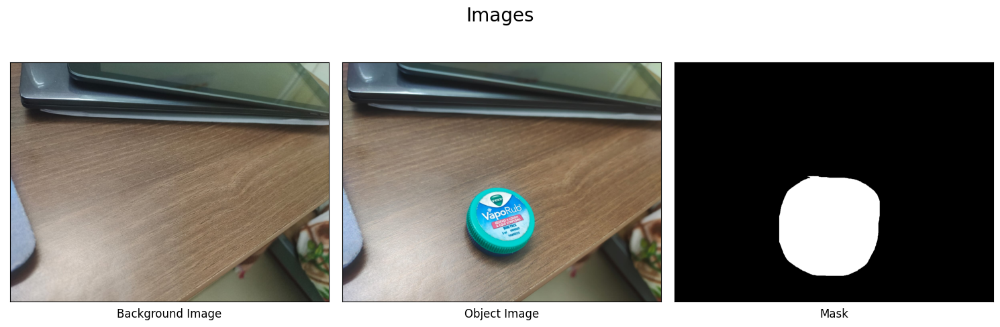

In [127]:
bg_img, obj_img, mask, destination, source, mask_path = load_images()
show_images("Images", [bg_img, obj_img, mask], ["Background Image", "Object Image", "Mask"], 1, 3, (15, 5))

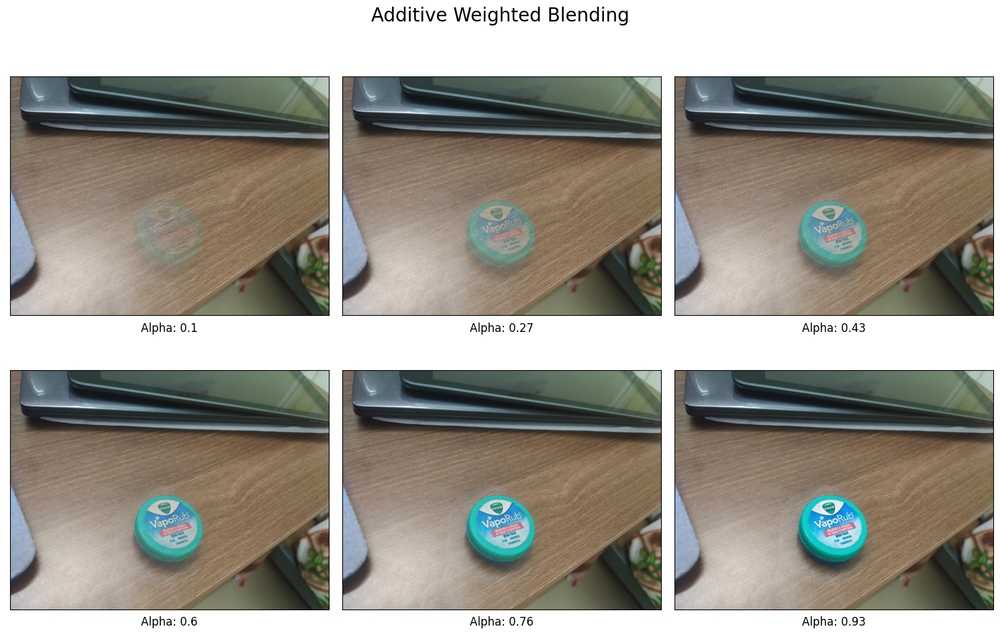

In [132]:
Run_Additive_Blend(bg_img, obj_img, mask)

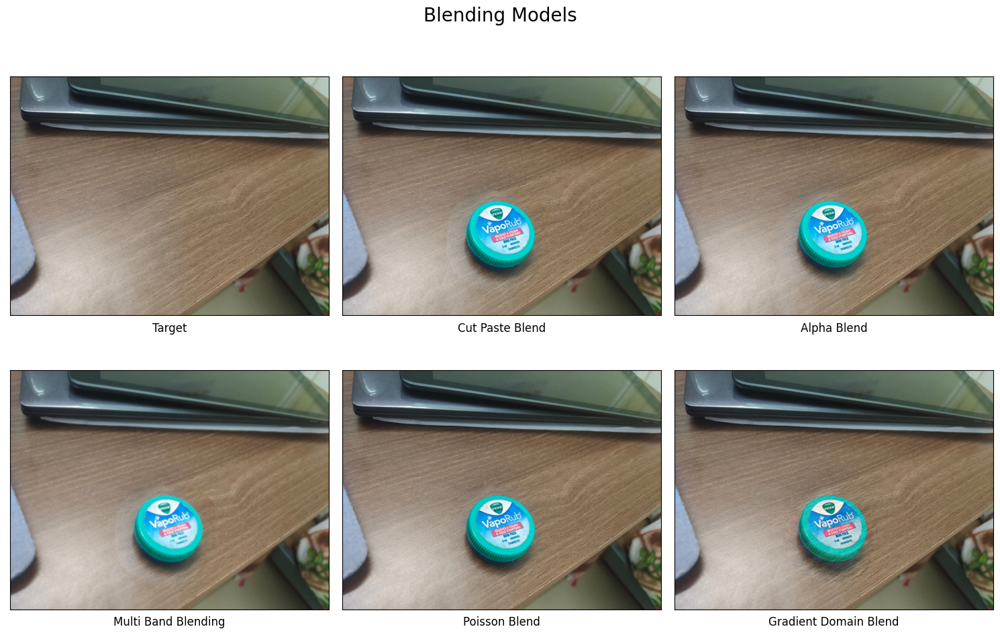

In [129]:
Run_All_Models(bg_img, obj_img, mask, destination, source, mask_path)

### --> Test Image 2

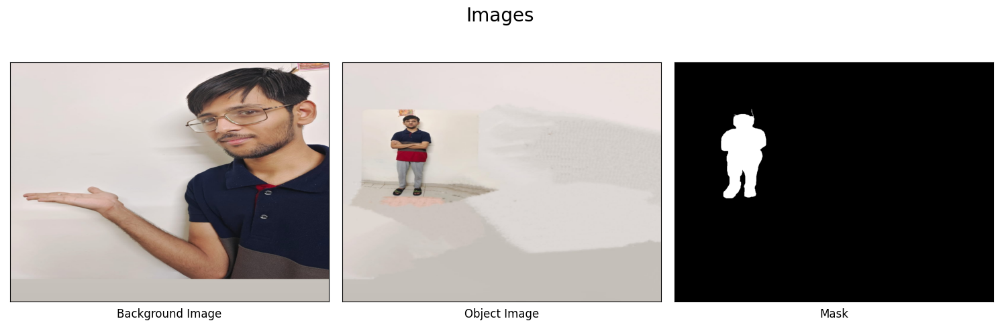

In [133]:
bg_img, obj_img, mask, destination, source, mask_path = load_images()
show_images("Images", [bg_img, obj_img, mask], ["Background Image", "Object Image", "Mask"], 1, 3, (15, 5))

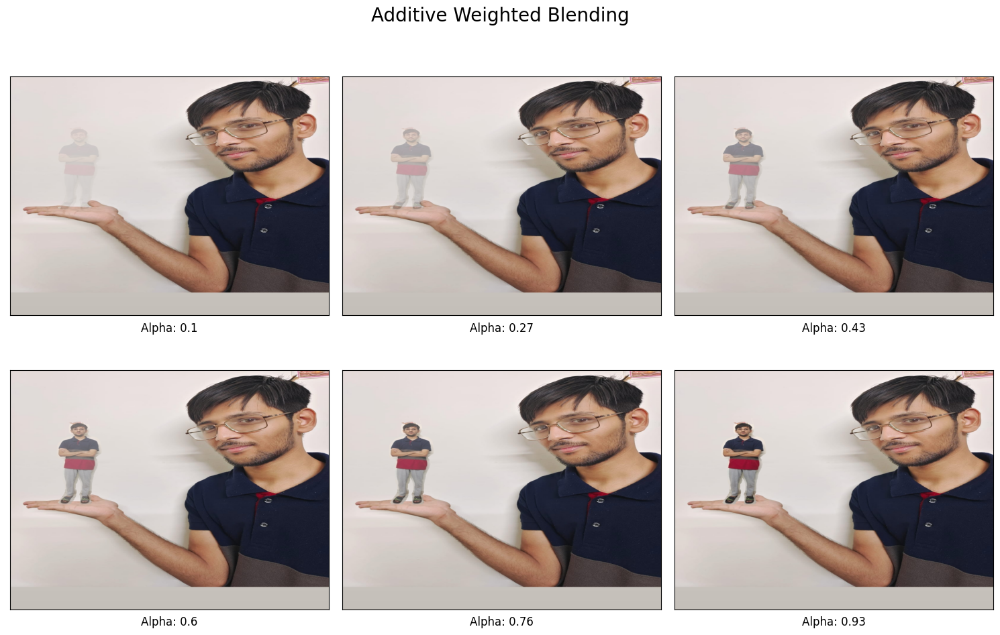

In [134]:
Run_Additive_Blend(bg_img, obj_img, mask)

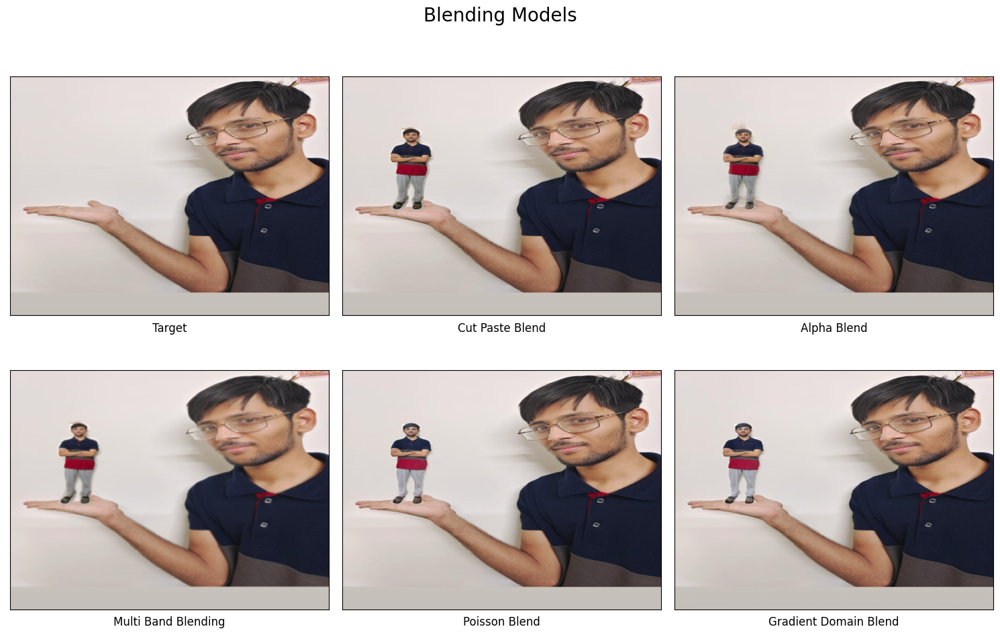

In [135]:
Run_All_Models(bg_img, obj_img, mask, destination, source, mask_path)

### --> Test Image 3

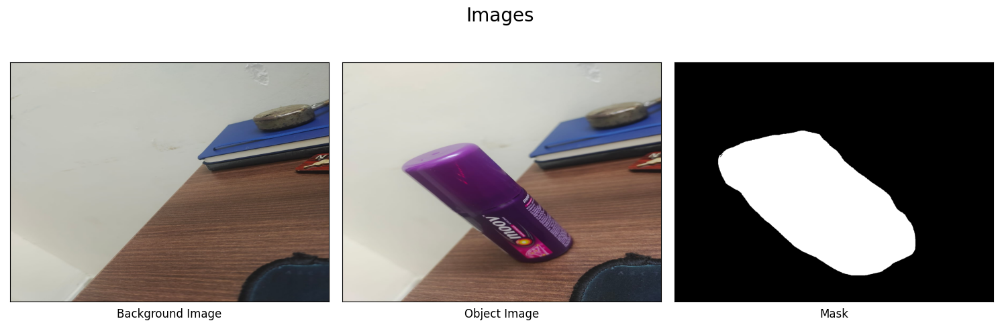

In [136]:
bg_img, obj_img, mask, destination, source, mask_path = load_images()
show_images("Images", [bg_img, obj_img, mask], ["Background Image", "Object Image", "Mask"], 1, 3, (15, 5))

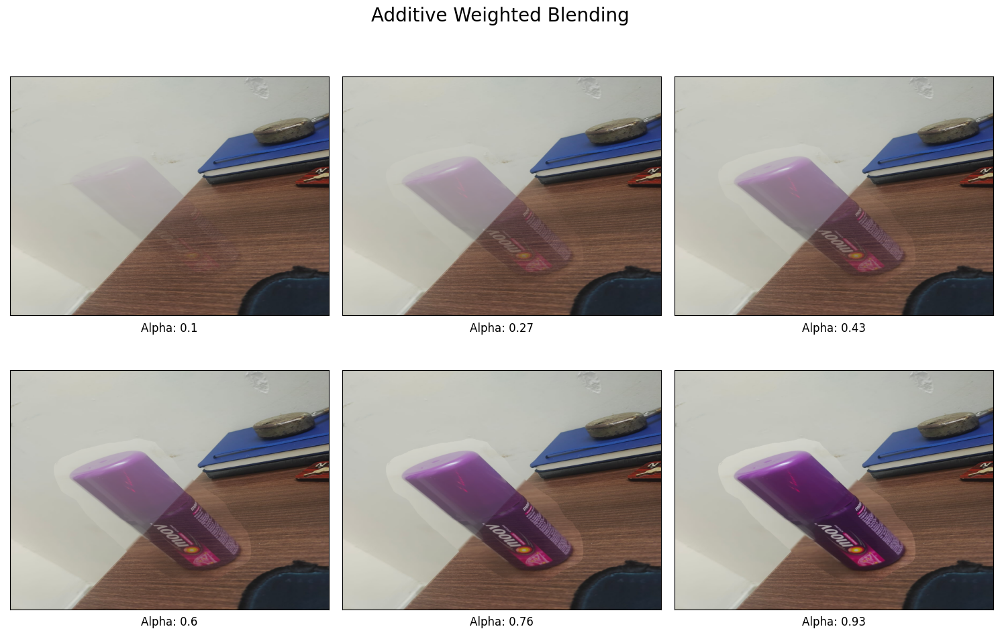

In [137]:
Run_Additive_Blend(bg_img, obj_img, mask)

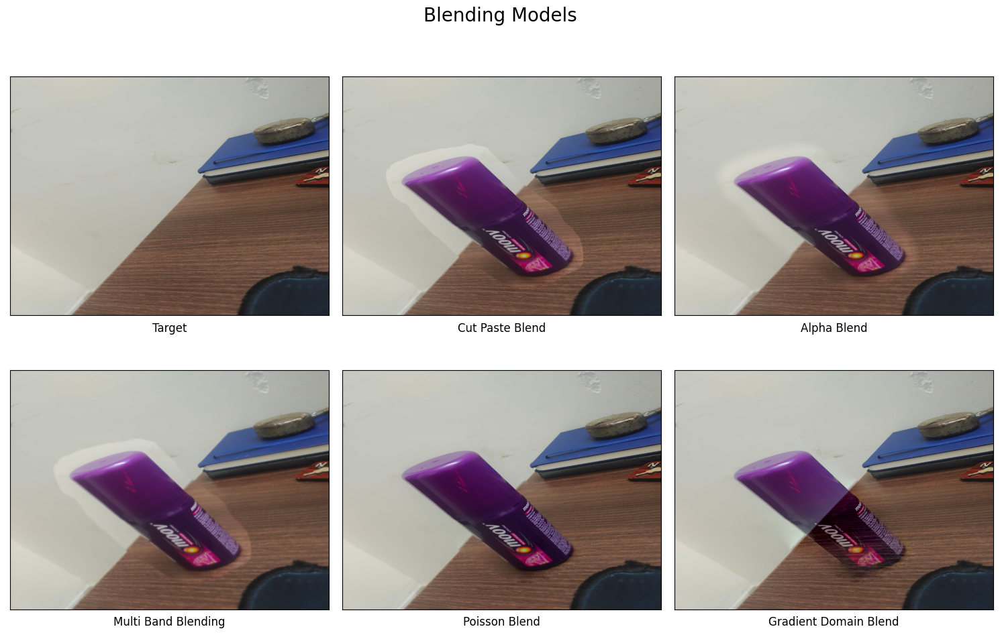

In [138]:
Run_All_Models(bg_img, obj_img, mask, destination, source, mask_path)

### --> Test Image 4

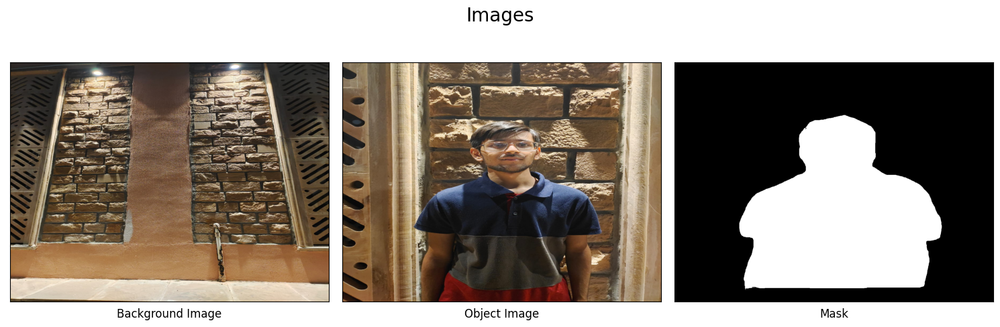

In [139]:
bg_img, obj_img, mask, destination, source, mask_path = load_images()
show_images("Images", [bg_img, obj_img, mask], ["Background Image", "Object Image", "Mask"], 1, 3, (15, 5))

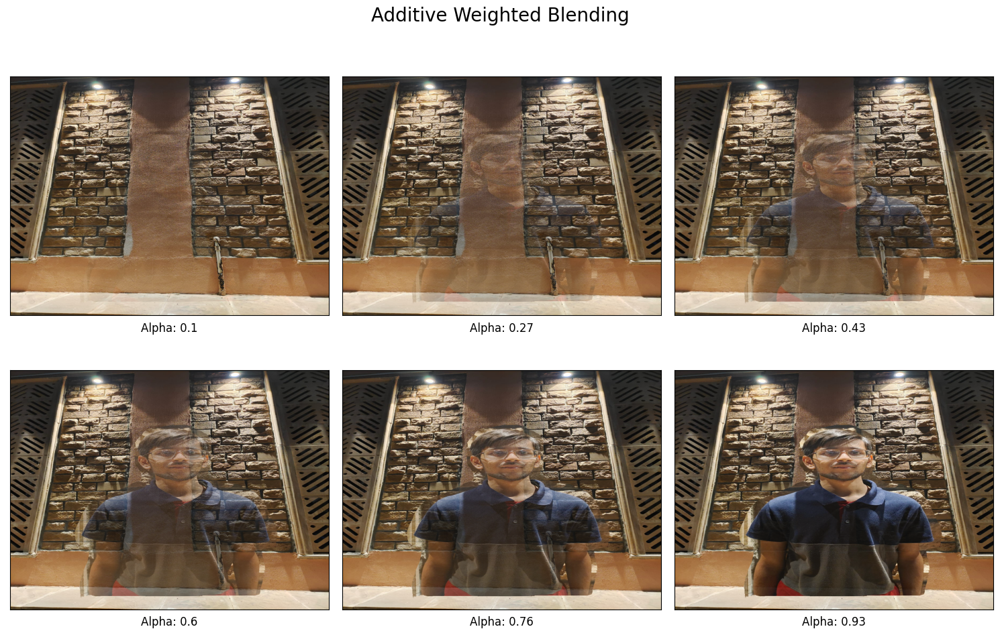

In [140]:
Run_Additive_Blend(bg_img, obj_img, mask)

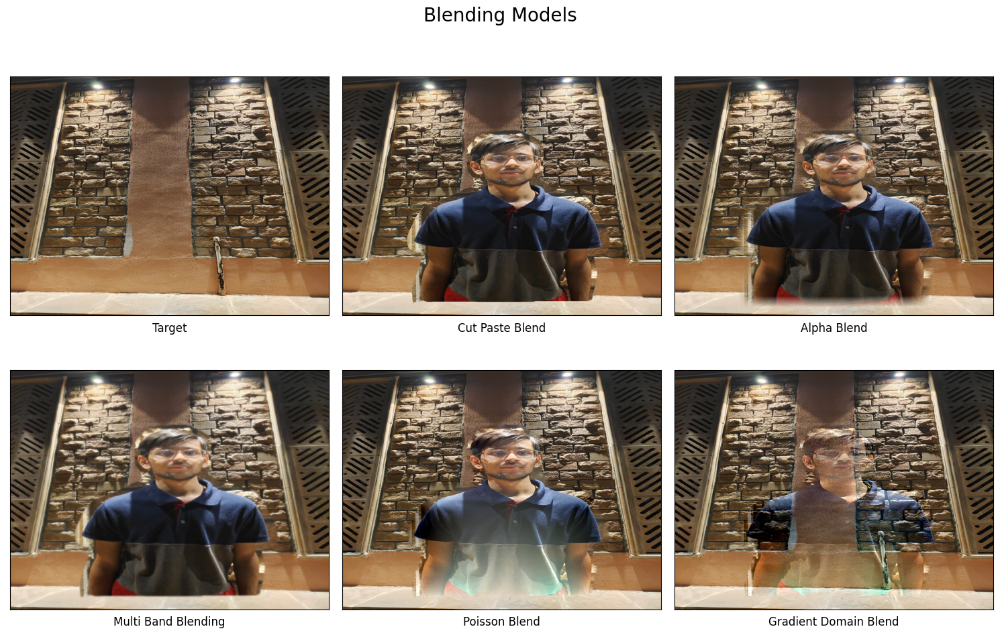

In [141]:
Run_All_Models(bg_img, obj_img, mask, destination, source, mask_path)

### --> Test Image 5

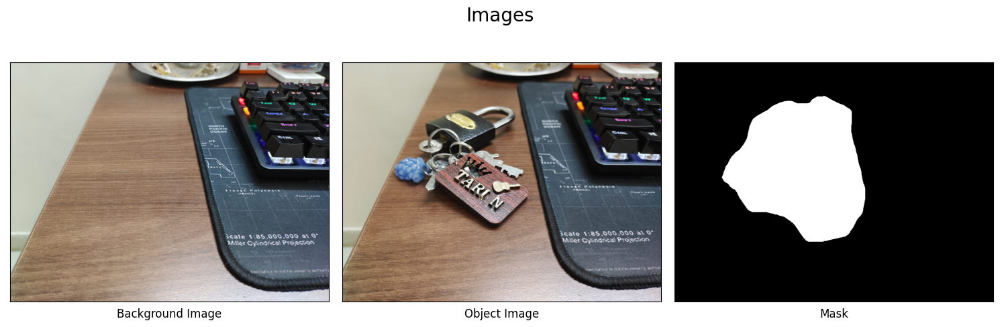

In [142]:
bg_img, obj_img, mask, destination, source, mask_path = load_images()
show_images("Images", [bg_img, obj_img, mask], ["Background Image", "Object Image", "Mask"], 1, 3, (15, 5))

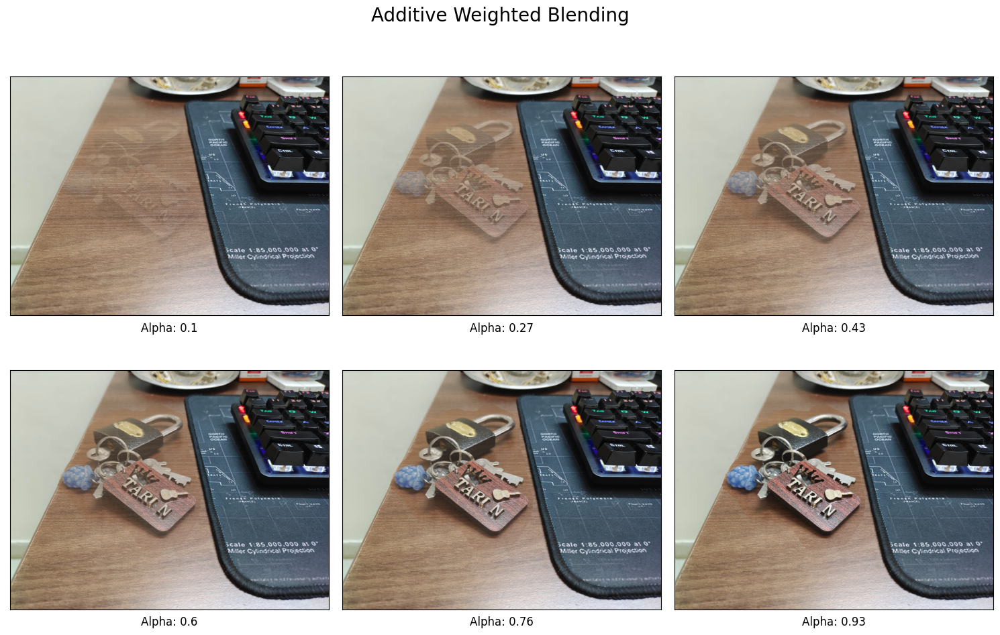

In [143]:
Run_Additive_Blend(bg_img, obj_img, mask)

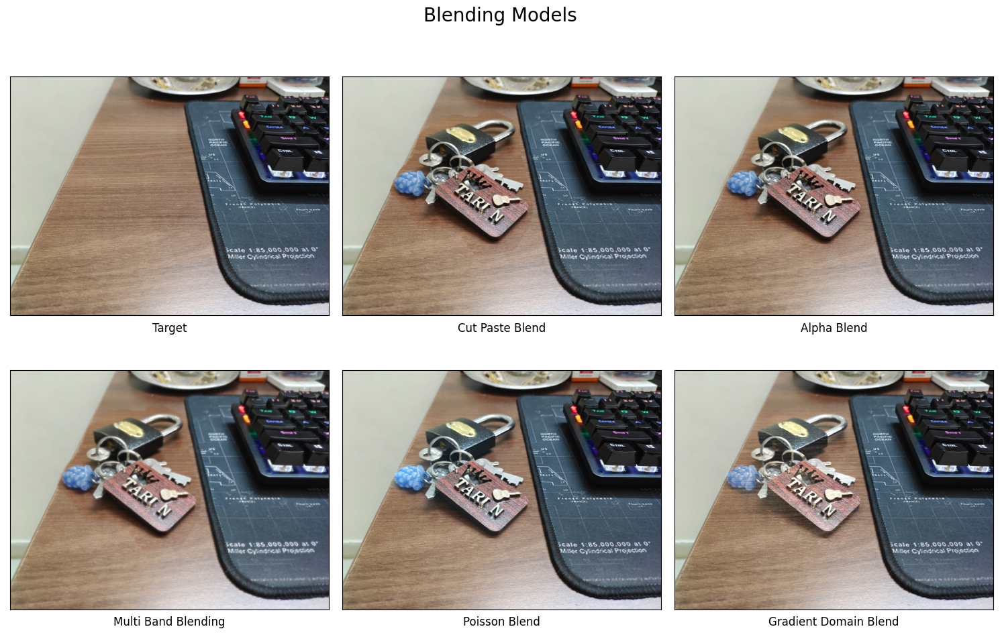

In [144]:
Run_All_Models(bg_img, obj_img, mask, destination, source, mask_path)